# Обнаружение и классификация пластиковых отходов
### Описание проекта  

**Заказчик**  

Renue — IT-компания из Екатеринбурга, специализируется на разработке высоконагруженных и отказоустойчивых решений для бизнеса и государственных организаций.  

**Работу выполнил**

Мельник Даниил Владимирович

**Описание**  

Цель проекта — разработать модель компьютерного зрения для детекции и классификации различных типов пластиковых отходов на изображениях, снятых с конвейерной ленты. Это решение автоматизирует процесс сортировки, повышая эффективность переработки и сокращая затраты на ручную работу.  

Проект проводится в формате индивидуального [соревнования на платформе Kaggle](https://www.kaggle.com/competitions/waste-detection). Основная метрика оценки — **mean Average Precision (mAP)**, отражающая точность детекции объектов.  

Для оценки качества модели используется среднее взвешенное по классам (weighted mean by class support).

Можно рассчитать по формуле:

Weighted mean$=\frac{\sum_{i=1}^{N} w_𝑖⋅𝑚𝐴𝑃_𝑖}{\sum_{i=1}^{N} w_𝑖}$

где:

$𝑚𝐴𝑃_i$ — значение каждого элемента,

$w_i$ — вес (или поддержка) каждого элемента,

$N$ — общее количество элементов.


**Данные**  

Заказчик предоставляет набор данных, включающий изображения отходов и их разметку.  

**Технологический стек**  

Python, NumPy, SciPy, PyTorch, OpenCV, Ultralytics  

---
### Цели и задачи проекта  


**Цель**  

Создать модель, способную детектировать и классифицировать различные виды отходов на
основе данных с конвейерной ленты.

**Задачи**  

* Ознакомиться с датасетом и подготовить данные для обучения модели.
* Исследовать существующие решения по детекции объектов, выбрать подходящую модель.
* Обучить модель, сравнить несколько подходов (например, использование предобученных моделей).
* Провести тестирование на предоставленных материалах.
* Провести анализ результатов и предложить возможные улучшения модели.
* Подготовить презентацию с результатами исследований и продемонстрировать работу системы.

---

### Установка библиотек

In [ ]:
# Установим библиотеки для работы с моделями детекции
!pip install pandas torch torchvision matplotlib opencv-python ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.1/899.1 kB 13.6 MB/s eta 0:00:00


In [ ]:
# Обновление библиотеки albumentations
!pip install albumentations -U -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.9/227.9 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 22.4 MB/s eta 0:00:00


### Импорт библиотек

In [ ]:
# Основные библиотеки
import os
import sys
import random
import ast
import shutil
from collections import defaultdict

# Работа с данными
import pandas as pd
import numpy as np

# Визуализация
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageDraw
from IPython.display import display

# Работа с изображениями
import cv2

# Машинное обучение и глубокое обучение
import tensorflow as tf
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

# Аугментации
import albumentations as A
from albumentations import (
    ShiftScaleRotate,
    HorizontalFlip,
    VerticalFlip,
    RandomBrightnessContrast,
    Resize,
    RandomResizedCrop,
)
from albumentations.core.composition import OneOf

# Работа с файлами и конфигурациями
from shutil import copy
import yaml

# Работа с Google Colab
from google.colab import drive

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Определение глобальных переменных

In [ ]:
RANDOM_STATE = 42
CL_NAMES = {
    0: "PET (transparent) (green)",
    1: "PET (transparent) (brown)",
    2: "PET (transparent) (blue)",
    3: "PET (transparent)",
    4: "PET (transparent) (dark blue)",
    5: "PET (black)",
    6: "PET (white)",
    7: "PET (sticker)",
    8: "PET (flacon)",
    9: "PET (household chemicals)",
    10: "PND (household chemicals)",
    11: "PND packet",
    12: "Other plastic",
    13: "Other plastic (transparent)",
    14: "Not plastic"
}

PATH = '/content/'

### Проверка наличия GPU

In [ ]:
print("GPU available:", tf.config.list_physical_devices('GPU'))

GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
    device = 'cpu'
else:
    print('CUDA is available!  Training on GPU ...')
    device = 'cuda'

CUDA is available!  Training on GPU ...


### Используемые функции

In [ ]:
def get_color_map(unique_categories):
    """
    Создает словарь соответствия category_id и цвета.

    Параметры:
        unique_categories (list): Список уникальных категорий.

    Возвращает:
        dict: Словарь {category_id: цвет}.
    """
    color_map = {}
    np.random.seed(42)  # Для воспроизводимости

    for category in unique_categories:
        color_map[category] = tuple(np.random.randint(0, 256, 3).tolist())  # RGB цвет

    return color_map

In [ ]:
def display_images(image_paths, annotations=None, grid_size=(3, 3), color_map=None, cli=-1):
    """
    Функция для отображения изображений с аннотациями bbox и выделением классов цветами.

    Параметры:
        image_paths (list): Список путей к изображениям.
        annotations (dict): Словарь с аннотациями в формате {image_name: [(class_id, bbox)]}.
                            bbox - список [x_min, y_min, x_max, y_max] или [x, y, w, h].
        grid_size (tuple): Размерность сетки (строки, столбцы).
        color_map (dict): Словарь соответствия {class_id: (R, G, B)}.
    """
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten()

    for i, image_path in enumerate(image_paths):
        if i >= rows * cols:
            break  # Ограничиваем количество отображаемых изображений

        ax = axes[i]

        # Проверяем существование изображения
        if not os.path.exists(image_path):
            ax.text(
                0.5, 0.5,
                "Изображение не найдено",
                color="red",
                ha="center",
                va="center"
            )
            ax.axis("off")
            continue

        # Загрузка изображения
        img = cv2.imread(image_path)
        if img is None:
            ax.text(
                0.5, 0.5,
                "Ошибка загрузки",
                color="red",
                ha="center",
                va="center"
            )
            ax.axis("off")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Извлечение имени изображения
        image_name = os.path.basename(image_path)
        annotation = annotations.get(image_name, []) if annotations else []

        # Наносим рамки bbox
        for class_id, bbox in annotation:
            color = color_map.get(class_id, (255, 255, 255))  # Цвет для класса
            if len(bbox) == 4:
                x_min, y_min, x_max, y_max = bbox
                cv2.rectangle(
                    img,
                    (int(x_min), int(y_min)),
                    (int(x_max), int(y_max)),
                    color,
                    2
                )

                # Извлекаем название класса из списка CL_NAMES
                class_name = CL_NAMES[class_id + cli] if class_id - 1 < len(CL_NAMES) else f"Class {class_id - 1}"

                # Добавляем текст (название класса) над рамкой
                cv2.putText(
                    img,
                    class_name,
                    (int(x_min), int(y_min) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1.5,
                    color,
                    2
                )

        # Отображение изображения
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(image_name)

    # Удаляем пустые графики
    for i in range(len(image_paths), rows * cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

In [ ]:
def safe_literal_eval(bbox_str):
    """
    Функция для преобразования колонки bbox из строкового формата в список
    """
    try:
        return ast.literal_eval(bbox_str)
    except (ValueError, SyntaxError):
        return None

In [ ]:
def prepare_yolo_format(data, images_folder, labels_folder, images_path):
    """
    Подготавливает данные в формате YOLO

    Аргументы:
        data (pd.DataFrame): Датафрейм с колонками file_name, bbox, category_id.
        images_folder (str): Путь к папке, куда перемещаются изображения.
        labels_folder (str): Путь к папке, куда записываются файлы разметки.
        images_path (str): Базовый путь к изображениям.

    Возвращает:
        None. Файлы сохраняются в указанных папках.
    """
    # Создание директорий, если их нет
    os.makedirs(images_folder, exist_ok=True)
    os.makedirs(labels_folder, exist_ok=True)

    def get_image_size(file_name):
        """
        Извлекает размеры изображения (ширина, высота).

        Аргументы:
            file_name (str): Имя файла изображения.

        Возвращает:
            tuple: Ширина и высота изображения.
        """
        with Image.open(os.path.join(images_path, file_name)) as img:
            return img.size

    # Обработка изображений и разметки
    for image_name in data['file_name'].unique():
        src_path = os.path.join(images_path, image_name)
        dest_path = os.path.join(images_folder, image_name)

        # Копирование изображения в папку
        shutil.copy(src_path, dest_path)

        # Подготовка пути для файла разметки
        label_path = os.path.join(
            labels_folder, f"{os.path.splitext(image_name)[0]}.txt"
        )

        # Фильтрация данных по текущему изображению
        image_data = data[data['file_name'] == image_name]

        # Получение размеров изображения
        width, height = get_image_size(image_name)

        annotations = []
        for _, row in image_data.iterrows():
            bbox = row['bbox']
            category_id = row['category_id']

            # Проверка корректности bbox и category_id
            if isinstance(bbox, list) and category_id > 0:
                x_min, y_min, box_width, box_height = bbox
                x_center = (x_min + box_width / 2) / width
                y_center = (y_min + box_height / 2) / height
                norm_width = box_width / width
                norm_height = box_height / height
                annotations.append(
                    f"{int(category_id) - 1} {x_center:.6f} {y_center:.6f} "
                    f"{norm_width:.6f} {norm_height:.6f}"
                )

        # Запись аннотаций в файл
        with open(label_path, 'w') as label_file:
            label_file.write("\n".join(annotations))

    print(
        f"Обработка данных завершена. Файлы сохранены в {images_folder} и {labels_folder}."
    )

In [ ]:
def yolo_to_annotations(labels_folder, images_folder, image_names):
    """
    Преобразует аннотации из YOLO-формата в формат [x_min, y_min, x_max, y_max].

    Параметры:
        labels_folder (str): Путь к папке с файлами аннотаций YOLO.
        images_folder (str): Путь к папке с изображениями.
        image_names (list): Список имён файлов изображений.

    Возвращает:
        dict: Словарь аннотаций {image_name: [(class_id, [x_min, y_min, x_max, y_max])]}.
    """
    annotations = {}
    for image_name in image_names:
        label_file = os.path.join(labels_folder, f"{os.path.splitext(image_name)[0]}.txt")
        image_path = os.path.join(images_folder, image_name)

        if not os.path.exists(label_file) or not os.path.exists(image_path):
            continue

        # Получаем размеры изображения
        with Image.open(image_path) as img:
            width, height = img.size

        with open(label_file, 'r') as file:
            bbox_data = file.readlines()

        bboxes = []
        for line in bbox_data:
            class_id, x_center, y_center, norm_width, norm_height = map(float, line.strip().split())
            x_center *= width
            y_center *= height
            bbox_width = norm_width * width
            bbox_height = norm_height * height
            x_min = x_center - bbox_width / 2
            y_min = y_center - bbox_height / 2
            x_max = x_center + bbox_width / 2
            y_max = y_center + bbox_height / 2
            bboxes.append((int(class_id), [x_min, y_min, x_max, y_max]))

        annotations[image_name] = bboxes

    return annotations

## Загрузка данных

Загрузим архив с данными из Google Drive и разархивируем его

In [ ]:
drive.mount(PATH +'drive')
if not os.path.exists('images'):
    !unzip -q /content/drive/MyDrive/waste-detection.zip

Mounted at /content/drive


Считаем тренировочный и тестовый датасеты

In [ ]:
train_df = pd.read_csv(PATH + 'train.csv')
test_df = pd.read_csv(PATH + 'test.csv')

Проверим содержимое тренировочного датасета

In [ ]:
# Посмотрим первые несколько строк
train_df.head()

,file_name,bbox,category_id
0,000001.jpg,"[840.0, 0.0, 176.0, 124.0]",4.0
1,000001.jpg,"[612.0, 306.0, 383.0, 397.0]",2.0
2,000001.jpg,"[990.92, 551.0, 105.00000000000011, 186.0]",4.0
3,000002.jpg,"[1000.0, 614.0, 98.0, 178.0]",4.0
4,000002.jpg,"[605.0, 358.0, 402.0, 409.0]",2.0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32265 entries, 0 to 32264
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   file_name    32265 non-null  object 
 1   bbox         32148 non-null  object 
 2   category_id  32148 non-null  float64
dtypes: float64(1), object(2)
memory usage: 756.3+ KB



В тренировочном наборе данных:

* Один файл может иметь несколько строк, содержащих рамки объектов (`bbox`) и их категории (`category_id`).
* Присутствуют пропуски в столбцах `bbox` и `category_id`.

Проверим содержимое тестового датасета

In [ ]:
test_df.head()

,file_name
0,000003.jpg
1,000006.jpg
2,000013.jpg
3,000016.jpg
4,000019.jpg


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2999 entries, 0 to 2998
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  2999 non-null   object
dtypes: object(1)
memory usage: 23.6+ KB


## Анализ данных

### Визуализируем пример изображений без разметки

Глянем несколько файлов, для которых пропущенны значения

In [ ]:
# Директория изображений
image_dir = PATH + 'images/'

In [ ]:
# Отбираем данные с пропущенными bbox или category_id
missing_data = train_df[
    train_df['bbox'].isnull() | train_df['category_id'].isnull()
]

In [ ]:
# Определяем пути к изображениям
image_paths = [
    os.path.join(image_dir, fname) for fname in missing_data['file_name']
]

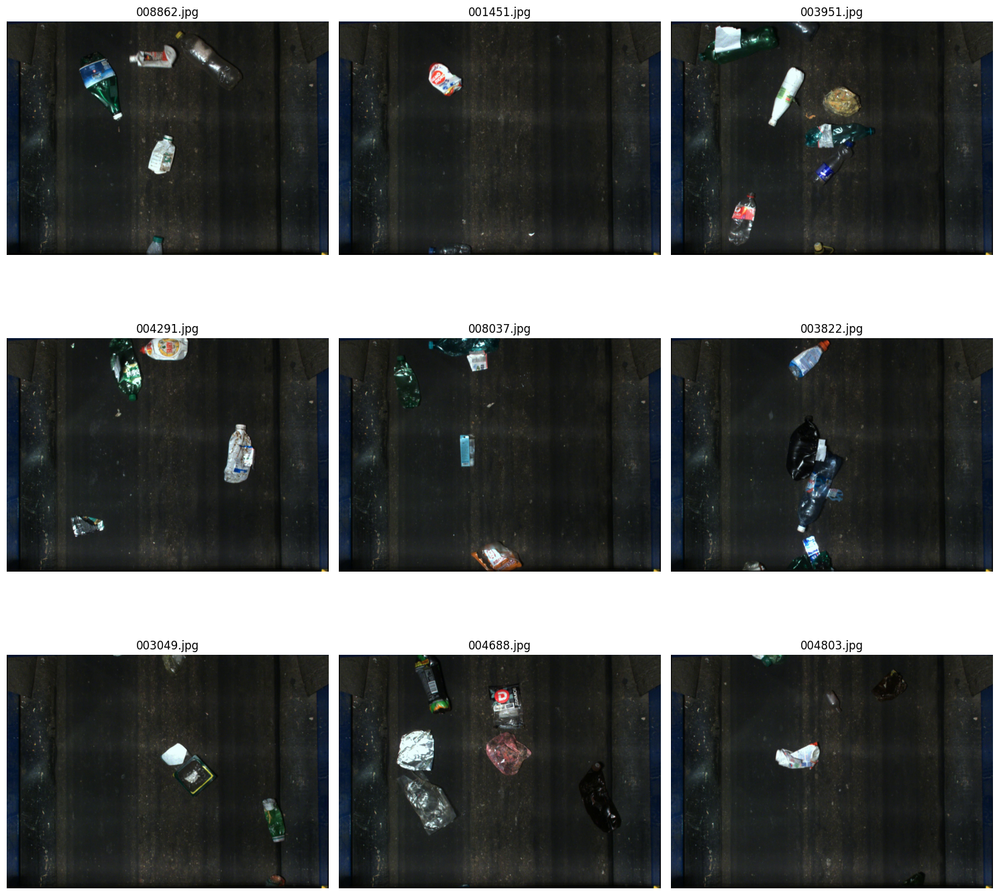

In [ ]:
# Визуализируем изображения
display_images(image_paths=image_paths)

На изображениях отсутствуют объекты для детекции

Преобразуем bbox в формат списка

In [ ]:
train_df['bbox'] = train_df['bbox'].apply(safe_literal_eval)

### Визуализируем пример изображений с разметкой

In [ ]:
# Генерация цветовой карты для категорий
unique_categories = train_df['category_id'].dropna().unique()
color_map = get_color_map(unique_categories)

In [ ]:
# Фильтруем строки с отсутствующими значениями в category_id
filtered_train_df = train_df.dropna(subset=['category_id'])

In [ ]:

unique_images = filtered_train_df['file_name'].unique()

In [ ]:
# Формирование аннотаций
annotations = {}
for _, row in filtered_train_df.iterrows():
    file_name = row['file_name']
    bbox = row['bbox']

    # Преобразуем [x, y, w, h] -> [x_min, y_min, x_max, y_max]
    bbox_converted = [
        bbox[0],
        bbox[1],
        bbox[0] + bbox[2],
        bbox[1] + bbox[3]
    ]
    category_id = row['category_id']

    if file_name not in annotations:
        annotations[file_name] = []
    annotations[file_name].append((category_id, bbox_converted))

In [ ]:
# Пути к изображениям
image_paths = [
    os.path.join(image_dir, file_name)
    for file_name in random.sample(list(unique_images), 9)  # Выбираем 9 случайных изображений
]

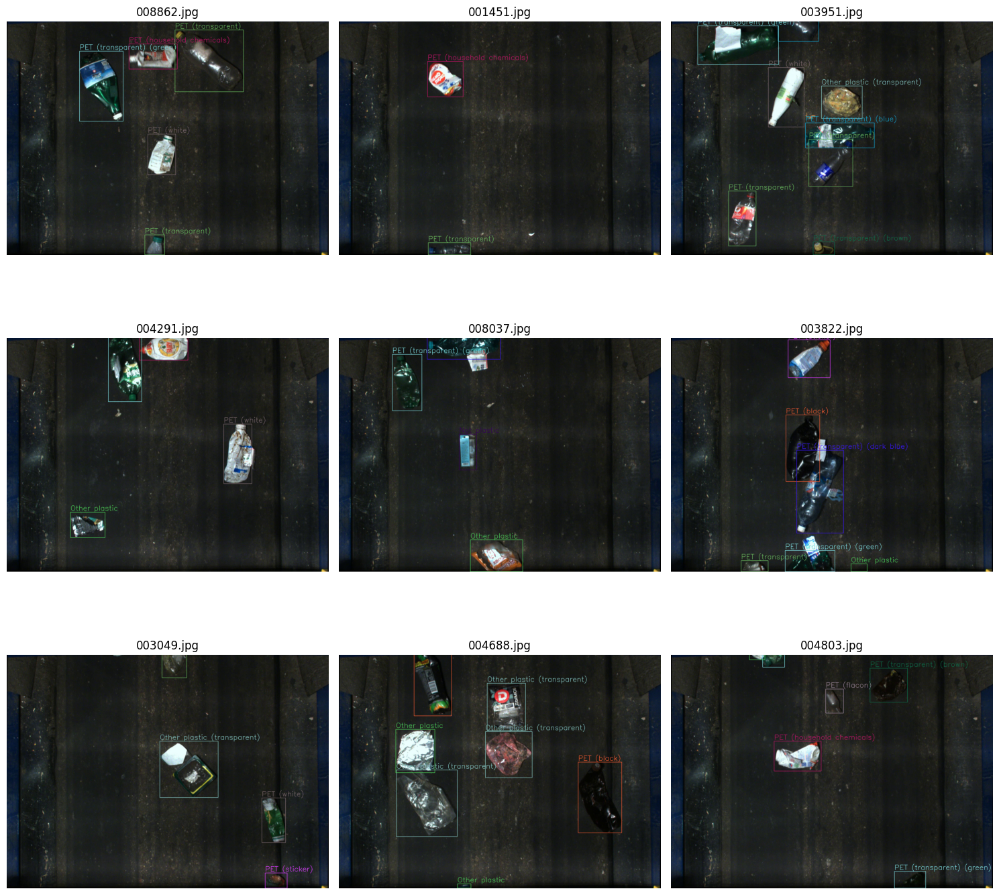

In [ ]:
# Отображение изображений с аннотациями
display_images(
    image_paths=image_paths,
    annotations=annotations,
    grid_size=(3, 3),
    color_map=color_map
)

### Проверим распределение классов, их пропорции, а также наличие аномалий в данных

In [ ]:
# Анализ распределения классов
class_counts = train_df['category_id'].value_counts()
class_counts

,count
category_id,
2.0,7310
1.0,4747
13.0,4553
4.0,3780
7.0,2530
14.0,2278
10.0,2123
15.0,1032
5.0,909


<ipython-input-37-404f70b2c602>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


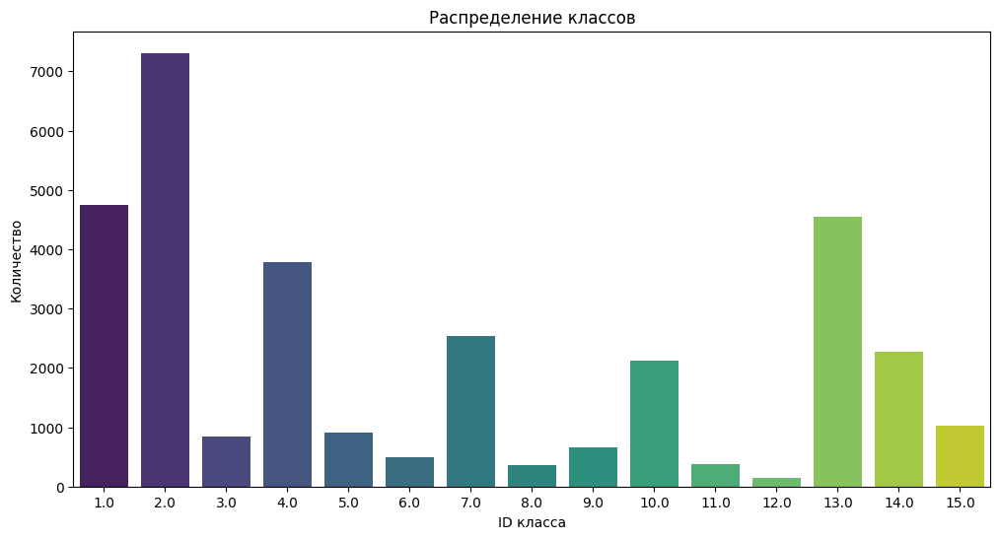

In [ ]:
# Построение графика
plt.figure(figsize=(12, 6))
sns.barplot(
    x=class_counts.index,
    y=class_counts.values,
    palette="viridis"
)
plt.title("Распределение классов")
plt.xlabel("ID класса")
plt.ylabel("Количество")
plt.show()

Наблюдается дисбаланс классов

## Предобработка данных

Подготовим данные для использования в модели.

### Разделим данные на тренировочную и валидационную выборки

In [ ]:
# Разделение данных на уникальные файлы тренировочной и валидационной выборок
train_files, val_files = train_test_split(
    train_df['file_name'].unique(),
    test_size=0.2,
    random_state=RANDOM_STATE
)
# Вывод размеров выборок
print(f"Тренировочная выборка: {len(train_files)} изображений")
print(f"Валидационная выборка: {len(val_files)} изображений")

Тренировочная выборка: 4800 изображений
Валидационная выборка: 1201 изображений


In [ ]:
# Фильтрация данных для тренировочной и валидационной выборки
train_images = train_df[train_df['file_name'].isin(train_files)]
val_images = train_df[train_df['file_name'].isin(val_files)]

Посмотрим получившиеся датафреймы

In [ ]:
train_images.head()

,file_name,bbox,category_id
0,000001.jpg,"[840.0, 0.0, 176.0, 124.0]",4.0
1,000001.jpg,"[612.0, 306.0, 383.0, 397.0]",2.0
2,000001.jpg,"[990.92, 551.0, 105.00000000000011, 186.0]",4.0
3,000002.jpg,"[1000.0, 614.0, 98.0, 178.0]",4.0
4,000002.jpg,"[605.0, 358.0, 402.0, 409.0]",2.0


In [ ]:
val_images.head()

,file_name,bbox,category_id
26,000011.jpg,"[999.0, 1150.0, 109.0, 175.0]",4.0
27,000011.jpg,"[618.0, 910.0, 374.0, 382.0]",2.0
28,000011.jpg,"[746.0, 142.0, 232.0, 539.0]",4.0
29,000011.jpg,"[686.0, 193.0, 169.0, 271.0]",10.0
49,000020.jpg,"[662.0, 1420.0, 157.0, 65.0]",2.0


### Подготовим данные в формате Yolo

Преобразуем тренировочную выборку в yolo-формат

In [ ]:
# Применение функции к тренировочным данным
prepare_yolo_format(
    train_images,
    images_folder=os.path.join(PATH, 'yolo_data/train/images'),
    labels_folder=os.path.join(PATH, 'yolo_data/train/labels'),
    images_path=os.path.join(PATH, 'images')
)

Обработка данных завершена. Файлы сохранены в /content/yolo_data/train/images и /content/yolo_data/train/labels.


Посмотрим на случайный файл из папки с разметкой и сравним с разметкой, до преобразования

In [ ]:
# Папка с разметкой
labels_folder = "/content/yolo_data/train/labels"

# Получаем список всех .txt файлов в папке
label_files = [file for file in os.listdir(labels_folder) if file.endswith('.txt')]

# Выбираем случайный файл из списка
random_file = random.choice(label_files)

# Путь к выбранному файлу
file_path = os.path.join(labels_folder, random_file)

# Читаем и выводим содержимое файла
with open(file_path, 'r') as file:
    content = file.read()

# Выводим содержимое файла
print(f"Содержимое файла {random_file}:\n")
print(content if content else "(Пустой файл)")

# Получаем имя изображения, заменив расширение .txt на .jpg
image_name = random_file.replace('.txt', '.jpg')

# Получаем данные из train_df для этого изображения
file_data = train_df[train_df['file_name'] == image_name]

# Выводим соответствующие строки из train_df
print(f"\nДанные для изображения {image_name} из train_df:")
display(file_data)

Содержимое файла 008517.txt:

12 0.820557 0.880552 0.152832 0.237550
1 0.315186 0.876178 0.142090 0.246299
1 0.356445 0.989569 0.100586 0.019515
3 0.450195 0.273553 0.157227 0.178331
9 0.438721 0.598250 0.162598 0.134590
1 0.630371 0.616756 0.118164 0.166218
6 0.394531 0.808546 0.146484 0.216016

Данные для изображения 008517.jpg из train_df:


,file_name,bbox,category_id
30512,008517.jpg,"[1524.0, 1132.0, 313.0, 353.0]",13.0
30513,008517.jpg,"[500.0, 1119.0, 291.0, 366.0]",2.0
30514,008517.jpg,"[627.0, 1456.0, 206.0, 29.0]",2.0
30515,008517.jpg,"[761.0, 274.0, 322.0, 265.0]",4.0
30516,008517.jpg,"[732.0, 789.0, 333.0, 200.0]",10.0
30517,008517.jpg,"[1170.0, 793.0, 242.0, 247.0]",2.0
30518,008517.jpg,"[658.0, 1041.0, 300.0, 321.0]",7.0


Отобразим изображения с аннотациями, после преобразования

In [ ]:
# Список всех изображений в папке
image_files = [f for f in os.listdir(PATH + 'yolo_data/train/images') if f.endswith('.jpg')]

# Преобразуем аннотации YOLO в формат для отображения
yolo_annotations = yolo_to_annotations(
    labels_folder=PATH + 'yolo_data/train/labels',
    images_folder=PATH + 'yolo_data/train/images',
    image_names=image_files,
)

# Случайно выбираем изображения для отображения
np.random.seed(RANDOM_STATE)
np.random.shuffle(image_files)
selected_images = image_files[:9]  # Берём 9 изображений для отображения

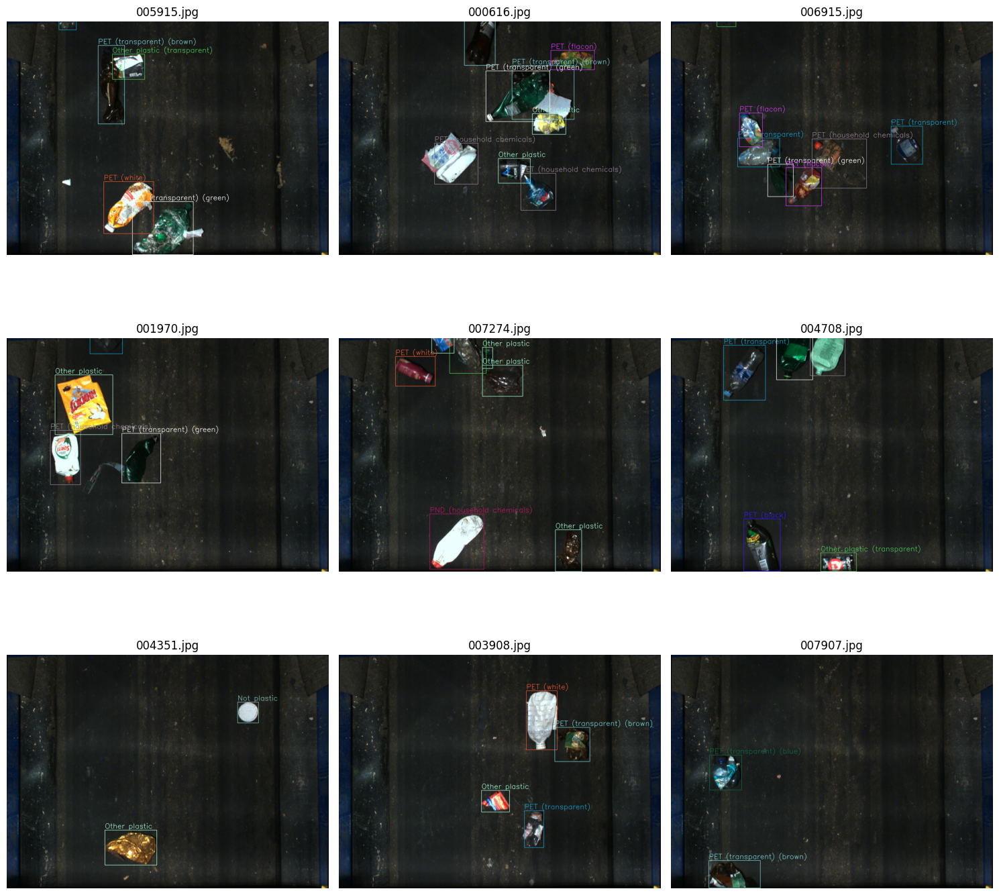

In [ ]:
# Отображаем изображения с аннотациями
display_images(
    image_paths=[os.path.join(PATH + 'yolo_data/train/images', img) for img in selected_images],
    annotations=yolo_annotations,
    grid_size=(3, 3),
    color_map=color_map,
    cli=0
)

Преобразуем валидационную выборку в yolo-формат

In [ ]:
prepare_yolo_format(
    val_images,
    images_folder = PATH + 'yolo_data/val/images',
    labels_folder = PATH + 'yolo_data/val/labels',
    images_path = PATH + 'images/'
)

Обработка данных завершена. Файлы сохранены в /content/yolo_data/val/images и /content/yolo_data/val/labels.


## Обучение модели Yolo v11

### Загрузим модель `yolo11n.pt`

In [ ]:
model = YOLO("yolo11n.pt")

100%|██████████| 5.35M/5.35M [00:00<00:00, 59.3MB/s]


### Зададим параметры модели

In [ ]:
train_image_dir = PATH + 'yolo_data/train/images'
train_label_dir = PATH + 'yolo_data/train/labels'
val_image_dir = PATH + 'yolo_data/val/images'
val_label_dir = PATH + 'yolo_data/val/labels'

In [ ]:
# Создаем конфигурационный файл для обучения
training_config = {
    "train": [train_image_dir, train_label_dir],
    "val": [val_image_dir, val_label_dir],
    "nc": len(CL_NAMES),  # Количество классов
    "names": CL_NAMES,  # Имена классов
}

In [ ]:
# Сохраняем конфигурацию в файл
with open("data.yaml", "w") as f:
    yaml.dump(training_config, f)

In [ ]:
# Параметры для обучения
training_params = {

    "epochs": 150,  # Количество эпох
    "batch": 128,    # Размер батча
    "imgsz": 864,   # Размер изображений
    "optimizer": "AdamW",  # Оптимизатор
    "lr0": 0.002,  # Начальная скорость обучения
    "lrf": 0.1,  # Конечная скорость обучения
    "momentum": 0.95,  # Моментум для оптимизатора
    "weight_decay": 0.001,  # Регуляризация L2
    "device": device,  # Использование GPU
    "save": True,  # Сохранение модели
    "cos_lr": True,  # Косинусное снижение скорости обучения
    "pretrained": True,  # Использование предварительно обученной модели
    "cache": True,  # Кэширование данных
    "verbose": False,
    "project": "waste_detection",  # Папка для сохранения результатов
    "name": "yolo",  # Имя эксперимента
    "augment": True  # Применение параметров аугментации

}

In [ ]:
# Путь к файлу данных
data_config = "data.yaml"  # Путь к файлу с конфигурацией данных

### Обучим модель

In [ ]:
model.train(data=data_config, **training_params)

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=data.yaml, epochs=150, time=None, patience=100, batch=128, imgsz=860, save=True, save_period=-1, cache=True, device=cuda, workers=8, project=waste_detection, name=yolo2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

train: Scanning /content/yolo_data/train/labels.cache... 4800 images, 99 backgrounds, 0 corrupt: 100%|██████████| 4800/4800 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (7.3GB RAM): 100%|██████████| 4800/4800 [00:15<00:00, 310.05it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/yolo_data/val/labels... 1201 images, 18 backgrounds, 0 corrupt: 100%|██████████| 1201/1201 [00:01<00:00, 1000.55it/s]


val: New cache created: /content/yolo_data/val/labels.cache
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (1.8GB RAM): 100%|██████████| 1201/1201 [00:13<00:00, 91.35it/s] 


Plotting labels to waste_detection/yolo2/labels.jpg... 
optimizer: AdamW(lr=0.002, momentum=0.95) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.002), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 864 train, 864 val
Using 8 dataloader workers
Logging results to waste_detection/yolo2
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      35.2G     0.9242      2.918       1.06        683        864: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.33s/it]


                   all       1201       6314     0.0199     0.0374     0.0126    0.00832

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      33.9G     0.7933       1.34     0.9977        671        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.441      0.139      0.167     0.0949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      33.6G     0.7499      1.034     0.9786        632        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.365      0.318      0.293      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      33.8G     0.7138     0.8737     0.9622        713        864: 100%|██████████| 38/38 [00:24<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]


                   all       1201       6314       0.33      0.364      0.281      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      33.7G     0.6906     0.7987     0.9581        626        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]


                   all       1201       6314      0.355      0.312      0.283      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150        34G      0.676     0.7334     0.9494        562        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]


                   all       1201       6314      0.479       0.42      0.404      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      33.7G     0.6432     0.6677     0.9407        699        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.19s/it]


                   all       1201       6314      0.513      0.447      0.437      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      33.8G     0.6389     0.6438     0.9393        611        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]


                   all       1201       6314      0.625      0.402      0.441      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      33.8G     0.6272     0.6218     0.9376        606        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.693      0.485       0.56      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      33.9G     0.6127     0.5991     0.9324        788        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.617      0.505      0.547      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      33.6G     0.6097     0.5755     0.9307        614        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]


                   all       1201       6314      0.665      0.513      0.581      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150        34G     0.5947     0.5617     0.9264        782        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.613      0.519      0.563      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150        34G     0.5964     0.5497     0.9251        704        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.756      0.598      0.686       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      34.1G     0.5811     0.5199     0.9191        669        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314      0.749       0.62      0.691       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      35.4G     0.5713     0.5117     0.9183        704        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.706      0.633      0.689      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      33.6G     0.5635     0.5079     0.9151        587        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314      0.761      0.519      0.643      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150        34G     0.5615     0.5042     0.9147        664        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314       0.69      0.616      0.649      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      33.9G     0.5573     0.4968     0.9139        641        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314      0.703      0.578      0.672      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      33.6G      0.552     0.4825     0.9112        591        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.712      0.594      0.649      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      33.8G     0.5468     0.4749     0.9086        611        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.774      0.636      0.725      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      33.8G     0.5397     0.4643     0.9091        624        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.763      0.633      0.729      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150        34G     0.5496     0.4689     0.9108        547        864: 100%|██████████| 38/38 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.766      0.713      0.788      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      33.8G     0.5346     0.4497     0.9052        677        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.759       0.68       0.76      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      33.7G     0.5231     0.4405     0.9021        649        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all       1201       6314      0.804      0.704      0.786      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      33.6G     0.5249     0.4382      0.904        576        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.849       0.68      0.794      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150        34G     0.5277     0.4391     0.9034        664        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314       0.81      0.678      0.763      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      33.8G     0.5283     0.4324     0.9037        703        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.842      0.753      0.845       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      34.9G     0.5132     0.4202     0.8992        612        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.845      0.743      0.839      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      33.7G     0.5188     0.4263     0.9006        605        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.764      0.688      0.754       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150        34G     0.5044     0.4183     0.8955        662        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314        0.8       0.77      0.825        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      33.6G     0.5096     0.4225     0.8994        542        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314       0.83      0.702      0.792      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      33.9G     0.5074     0.4206     0.8965        623        864: 100%|██████████| 38/38 [00:24<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.748      0.697      0.761      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150        34G     0.5162     0.4224        0.9        652        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all       1201       6314      0.864      0.767      0.853      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150        34G     0.4956     0.3999     0.8936        663        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.874      0.758      0.847      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150        34G     0.4909     0.4003      0.893        615        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314      0.816      0.757      0.831      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      33.6G      0.493     0.4029     0.8911        741        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.879      0.738      0.844      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150        34G     0.4881      0.397     0.8905        613        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.878      0.771       0.86      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      33.8G     0.4885     0.3905     0.8913        669        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.887      0.798      0.885      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150        34G     0.4842     0.3863     0.8895        589        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.871       0.78      0.868      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      33.6G     0.4846     0.3813     0.8865        602        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.871      0.769       0.87      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150        34G     0.4763     0.3731     0.8832        696        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all       1201       6314      0.905      0.769      0.878      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      35.5G     0.4646     0.3647     0.8808        652        864: 100%|██████████| 38/38 [00:25<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.12s/it]

                   all       1201       6314        0.9      0.779      0.884      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      33.8G     0.4694     0.3714     0.8825        579        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314      0.915      0.814      0.892      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      33.6G     0.4725     0.3734     0.8818        629        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.882      0.804      0.882      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      33.9G     0.4634     0.3635     0.8761        592        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.873      0.773      0.868      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      33.7G     0.4615     0.3632       0.88        697        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.893      0.813       0.89      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150        34G     0.4557     0.3582     0.8769        623        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.884      0.785      0.874      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      33.7G     0.4634      0.364     0.8809        710        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.899      0.802      0.881      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150        34G     0.4622     0.3591     0.8795        619        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.942       0.84       0.92      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      33.8G     0.4511     0.3494     0.8788        655        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.908      0.823      0.899      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      33.7G     0.4452     0.3453     0.8737        647        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314      0.899      0.818      0.898      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      35.2G     0.4542     0.3494     0.8753        705        864: 100%|██████████| 38/38 [00:25<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.889       0.82      0.893      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      33.8G     0.4466     0.3431     0.8723        669        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.909      0.835      0.901       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150        34G     0.4452     0.3421     0.8725        645        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314       0.92      0.807      0.895      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      33.8G     0.4418     0.3404     0.8728        651        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314      0.917      0.844      0.909       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      34.1G      0.435     0.3302     0.8729        647        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.901      0.808      0.888       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      33.6G     0.4346     0.3291     0.8706        598        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.895      0.811      0.888      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150        34G     0.4355     0.3314     0.8696        695        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314       0.93      0.834      0.907      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      33.9G     0.4323     0.3273     0.8698        707        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.911      0.852      0.912      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      33.8G     0.4292     0.3222     0.8687        566        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.917      0.832      0.903      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      33.7G      0.428      0.322     0.8681        667        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.904      0.838      0.903      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      33.7G      0.429     0.3223     0.8683        612        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.913      0.849      0.914      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      34.1G     0.4239     0.3182     0.8663        720        864: 100%|██████████| 38/38 [00:25<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.916      0.847      0.912      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      33.9G     0.4251     0.3153      0.867        630        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.925      0.848      0.914      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      33.9G     0.4212     0.3142      0.866        632        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.876      0.722      0.835       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      33.9G     0.4187     0.3115     0.8657        703        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.946      0.847      0.921      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      33.9G     0.4171     0.3117     0.8624        644        864: 100%|██████████| 38/38 [00:24<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.919      0.833      0.922      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150        34G      0.417     0.3108      0.865        702        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.947      0.847      0.921      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      33.9G     0.4169     0.3072     0.8657        783        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.951      0.846      0.919      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150        34G     0.4139      0.303     0.8645        634        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.945      0.865      0.934      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150        34G     0.4102     0.3024     0.8618        590        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.946      0.869      0.928      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150        34G     0.4044     0.2992     0.8624        700        864: 100%|██████████| 38/38 [00:25<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314       0.95       0.86      0.921      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      33.8G     0.4103     0.3037     0.8655        566        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.939       0.87      0.925       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      33.8G     0.4074     0.2998     0.8625        685        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.947       0.86      0.929      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      33.6G     0.4041     0.2979     0.8617        648        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.947      0.883      0.936      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      33.7G      0.401     0.2924     0.8606        576        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.00s/it]

                   all       1201       6314       0.95      0.859      0.923       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150        34G     0.4017      0.294     0.8613        655        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.952      0.876      0.933      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      33.6G     0.3998     0.2944     0.8608        700        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.937      0.869      0.923      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      35.1G     0.4024     0.2946     0.8607        717        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.948      0.863      0.929      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      33.9G     0.3947     0.2876      0.858        669        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all       1201       6314      0.956      0.876      0.934      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      33.8G     0.3962     0.2886     0.8578        653        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314       0.94      0.852      0.922       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      33.7G     0.3914     0.2868     0.8574        745        864: 100%|██████████| 38/38 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all       1201       6314      0.956      0.873      0.935      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      33.6G     0.3921     0.2861     0.8582        624        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all       1201       6314      0.951      0.874      0.939      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      33.6G     0.3887     0.2843     0.8578        615        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.962      0.858       0.93      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      33.8G     0.3892     0.2823     0.8562        710        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314       0.96      0.876      0.939      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150        34G     0.3842     0.2788      0.854        675        864: 100%|██████████| 38/38 [00:24<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]

                   all       1201       6314      0.961      0.889      0.943      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      33.6G     0.3806     0.2757     0.8542        661        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.951       0.88      0.933      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      33.6G     0.3821     0.2765     0.8534        785        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.962      0.874      0.941      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      33.8G     0.3804     0.2736     0.8534        621        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all       1201       6314      0.971      0.879      0.941      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150        34G     0.3798     0.2756     0.8542        652        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.968      0.867      0.936      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150        34G     0.3866     0.2767     0.8563        708        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all       1201       6314      0.963      0.873      0.939      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      33.8G     0.3787     0.2729     0.8529        680        864: 100%|██████████| 38/38 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.963       0.88      0.936       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      33.9G     0.3765     0.2714     0.8515        651        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.968      0.882      0.945      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      34.1G     0.3706     0.2706     0.8491        623        864: 100%|██████████| 38/38 [00:25<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314       0.96      0.892      0.942      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      33.8G     0.3694     0.2675     0.8511        631        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all       1201       6314      0.966      0.873      0.935      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      33.6G     0.3693     0.2667     0.8507        755        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.952       0.89      0.939      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150        34G     0.3669     0.2641     0.8492        740        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.953      0.887      0.939      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      33.9G     0.3679     0.2666     0.8501        612        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.953      0.884       0.94      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      35.1G     0.3661     0.2642     0.8502        669        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.949      0.886      0.938      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      33.8G     0.3682      0.263     0.8507        679        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.953      0.893      0.941      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      33.9G     0.3645     0.2645     0.8492        636        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.959      0.887      0.943      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      33.7G       0.36     0.2582     0.8474        665        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314      0.962      0.879      0.938      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      33.7G     0.3597     0.2597     0.8483        552        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.956      0.891      0.941      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      33.8G      0.362     0.2595     0.8497        645        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.955      0.894      0.943      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      33.9G     0.3569     0.2567     0.8474        669        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.963      0.882      0.938      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      33.6G     0.3551      0.256      0.847        606        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.06s/it]

                   all       1201       6314      0.956       0.88      0.937      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      36.1G     0.3571     0.2592     0.8478        704        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.952      0.892      0.943      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      33.9G     0.3502     0.2544     0.8451        755        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314       0.97      0.886      0.945      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      33.6G     0.3515     0.2522     0.8477        647        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.957      0.899      0.946      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150        34G     0.3548     0.2532      0.847        680        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all       1201       6314      0.972      0.878      0.944      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      33.6G     0.3499     0.2519     0.8468        689        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.969      0.888      0.945      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      33.9G     0.3475     0.2495     0.8451        620        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.952      0.895      0.944      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      33.8G      0.349     0.2508     0.8456        687        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.966      0.891      0.943      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      33.9G      0.348     0.2499     0.8453        701        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.971      0.892      0.943       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      33.9G     0.3476     0.2491     0.8459        707        864: 100%|██████████| 38/38 [00:25<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.972      0.891      0.946      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      33.6G     0.3425     0.2469     0.8421        644        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.04s/it]

                   all       1201       6314       0.97      0.888      0.945      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      33.6G     0.3422     0.2441     0.8419        644        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.971      0.888      0.944      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      33.8G      0.342     0.2437     0.8404        732        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.968      0.895      0.944      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      33.6G     0.3423     0.2451     0.8426        596        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.05it/s]

                   all       1201       6314      0.965      0.891      0.942      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150        34G     0.3436      0.245      0.842        663        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314      0.963      0.894      0.945      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      33.9G      0.333      0.238     0.8395        706        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]

                   all       1201       6314      0.971      0.887      0.944      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      33.8G     0.3387     0.2393     0.8417        623        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.971      0.891      0.945      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      33.7G     0.3383     0.2403     0.8424        714        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]

                   all       1201       6314      0.972      0.891      0.946      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      33.7G      0.337     0.2392     0.8423        620        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.00it/s]

                   all       1201       6314       0.97      0.887      0.946      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      33.8G     0.3339     0.2361     0.8402        665        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.969      0.887      0.944      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150        34G     0.3354     0.2373     0.8398        614        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.968      0.889      0.946       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      33.7G     0.3356     0.2381     0.8402        716        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.968      0.895      0.948      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      33.6G     0.3343     0.2393     0.8399        741        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.973      0.895      0.945      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      33.6G     0.3296     0.2367     0.8393        555        864: 100%|██████████| 38/38 [00:24<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all       1201       6314      0.973      0.894      0.946      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      33.6G     0.3306      0.235     0.8381        668        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314       0.97      0.898      0.948      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150        34G      0.328     0.2349     0.8386        591        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.03s/it]

                   all       1201       6314      0.969      0.898      0.948      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      33.7G     0.3314     0.2382     0.8399        636        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.962      0.903      0.947      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      33.7G     0.3295     0.2339      0.837        566        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.967      0.898      0.947      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      33.7G     0.3247     0.2321     0.8375        780        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.973      0.892      0.948      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      34.1G     0.3277     0.2322     0.8385        640        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.972      0.896      0.948      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150        34G      0.328     0.2336     0.8386        603        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.972      0.895      0.948       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150        34G     0.3275     0.2311     0.8381        608        864: 100%|██████████| 38/38 [00:25<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]

                   all       1201       6314      0.969      0.902      0.948      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      33.6G     0.3264     0.2316      0.839        724        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.971      0.898      0.949      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      33.7G      0.325     0.2316      0.838        626        864: 100%|██████████| 38/38 [00:25<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.03it/s]

                   all       1201       6314      0.967      0.901      0.948      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150        34G     0.3273     0.2312     0.8398        667        864: 100%|██████████| 38/38 [00:25<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.966      0.903      0.949      0.852


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      34.6G     0.4877     0.3319     0.8844        360        864: 100%|██████████| 38/38 [00:30<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.00s/it]

                   all       1201       6314      0.966      0.894      0.943      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      35.2G     0.4609     0.2911     0.8711        340        864: 100%|██████████| 38/38 [00:24<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]

                   all       1201       6314      0.975      0.897      0.946      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      35.2G     0.4526     0.2757     0.8651        302        864: 100%|██████████| 38/38 [00:24<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.975      0.896       0.95      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      35.2G     0.4476      0.268     0.8654        362        864: 100%|██████████| 38/38 [00:24<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]

                   all       1201       6314      0.975        0.9       0.95      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      35.2G     0.4428     0.2658     0.8649        339        864: 100%|██████████| 38/38 [00:24<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.01s/it]

                   all       1201       6314      0.977        0.9      0.949      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      34.6G     0.4412     0.2659     0.8594        347        864: 100%|██████████| 38/38 [00:24<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all       1201       6314      0.978      0.903      0.951      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      35.2G     0.4384     0.2683     0.8601        340        864: 100%|██████████| 38/38 [00:24<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.972      0.905      0.951      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      35.2G     0.4327     0.2581     0.8581        363        864: 100%|██████████| 38/38 [00:24<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]

                   all       1201       6314      0.975      0.908      0.952      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      34.6G     0.4323     0.2644     0.8594        338        864: 100%|██████████| 38/38 [00:24<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314       0.98      0.903      0.952      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      34.6G     0.4333     0.2644     0.8587        323        864: 100%|██████████| 38/38 [00:24<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.01it/s]

                   all       1201       6314      0.978      0.908      0.952      0.857



150 epochs completed in 1.301 hours.
Optimizer stripped from waste_detection/yolo2/weights/last.pt, 5.5MB
Optimizer stripped from waste_detection/yolo2/weights/best.pt, 5.5MB

Validating waste_detection/yolo2/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:09<00:00,  1.98s/it]


                   all       1201       6314      0.975      0.907      0.953      0.854
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to waste_detection/yolo2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7aa314331b10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

1. **Общие характеристики**:
   - Модель YOLO11n была обучена на 150 эпохах.
   - Использовалась предобученная модель с применением оптимизатора AdamW, с начальной скоростью обучения 0.002 и коэффициентом momentum 0.95.
   - Размер изображений в обучении и валидации был установлен на 864 пикселя.

2. **Параметры потерь**:
   - На протяжении обучения наблюдается постепенное снижение потерь по всем ключевым меткам: **box_loss**, **cls_loss** и **dfl_loss**, что указывает на улучшение качества предсказаний модели.

3. **Оценки производительности**:

   **Тренировочная выборка**:
   - **Precision (P): 0.978**  
  Высокая точность означает, что модель редко ошибается, классифицируя объекты неверно. Практически все детектированные объекты действительно являются мусором.
  
   - **Recall (R): 0.908**  
  Хорошая полнота показывает, что модель обнаруживает большинство объектов на изображении, хотя ещё есть пространство для улучшения.

   - **mAP@50: 0.952**  
  На пороге IoU=50% (Intersection over Union) модель демонстрирует отличное качество. Это указывает на высокую точность локализации объектов.

   - **mAP@50-95: 0.857**  
  Уровень среднего качества на разных порогах IoU (от 50% до 95%) также высокий. Это особенно важно, так как модель хорошо справляется даже с более строгими критериями.

   **Валидационная выборка**:
   - **Precision (P): 0.975**  
  Чуть ниже, чем на тренировочной выборке, но разница минимальна. Это указывает на отсутствие сильного переобучения.

   - **Recall (R): 0.907**  
  Полнота идентична тренировочной выборке. Это хороший признак, что модель стабильно распознает объекты на данных, которых она раньше не видела.

   - **mAP@50: 0.953**  
  Очень близко к тренировочным данным. Модель сохраняет высокую точность локализации.

   - **mAP@50-95: 0.854**  
  Незначительно ниже, чем на тренировочной выборке.

   Эти значения показывают, что модель демонстрирует отличную производительность как на тренировочной, так и на валидационной выборке. Высокие значения точности (precision) и полноты (recall), а также высокая средняя точность (mAP) на обеих выборках свидетельствуют о хорошем качестве предсказаний модели.

4. **Дополнительные замечания**:
   - Применение расширений данных, таких как случайные перевороты (flip), масштабирование (scale), улучшение контраста и других техник аугментации, помогло улучшить общие результаты модели.

В целом, модель достигла высоких показателей точности и полноты, и её можно использовать для дальнейших этапов или для финальной интеграции в систему распознавания отходов.

### Предсказания на тестовых данных

In [ ]:
# Список путей к изображениям тестового набора
test_image_paths = [os.path.join(image_dir, file_name) for file_name in test_df['file_name']]

In [ ]:
# Создадим результирующий словарь
formatted_predictions = defaultdict(list)

In [ ]:
for image_path in test_image_paths:
    results = model(image_path)
    for result in results:
        for box in result.boxes:
            x_min, y_min, x_max, y_max = box.xyxy[0].tolist()
            confidence = box.conf[0].item()
            category_id = int(box.cls[0].item())  # Класс объекта +1
            width = x_max - x_min
            height = y_max - y_min

            file_name = os.path.basename(image_path)
            formatted_predictions[file_name].append([
                float(category_id)+1,  # Класс объекта
                round(confidence, 2),  # Уверенность
                round(x_min, 2),  # x_left
                round(y_min, 2),  # y_top
                round(width, 2),  # width
                round(height, 2)  # height
            ])

In [ ]:
# Создадим список для DataFrame
submission_data = []

In [ ]:
for file_name, objects in formatted_predictions.items():
    # Преобразуем список объектов в строку
    objects_str = str(objects)
    submission_data.append({'file_name': file_name, 'predictions': objects_str})

In [ ]:
# Преобразуем в DataFrame
submission_df = pd.DataFrame(submission_data)

In [ ]:
# Убедимся, что все изображения из тестового набора включены, даже если предсказания пустые
all_files = set(test_df['file_name'])
predicted_files = set(submission_df['file_name'])
missing_files = all_files - predicted_files

In [ ]:
for file_name in missing_files:
    submission_df = pd.concat([submission_df, pd.DataFrame([{'file_name': file_name, 'predictions': '[]'}])])

In [ ]:
# Сортируем строки по file_name, чтобы сохранить порядок
submission_df = submission_df.sort_values(by='file_name').reset_index(drop=True)

Сохраним файл `submission.csv`

In [ ]:
# Форматирование текущей даты и времени
current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# Имя файла с датой и временем
file_name = f"submission_{current_time}.csv"
# Сохранение файла
file_path = f"/content/drive/My Drive/{file_name}"
# Сохраняем в CSV
submission_df.to_csv(file_path, index=False)
print(f"Файл сохранён по пути: {file_path}")

Файл сохранён по пути: /content/drive/My Drive/submission_2024-12-02_21-34-41.csv


Проверим первые строки файла

In [ ]:
# Проверяем первые строки файла
submission_sample = pd.read_csv(file_path)
print(submission_sample.head())

    file_name                                        predictions
0  000003.jpg  [[2.0, 0.96, 609.33, 424.2, 380.66, 392.4], [4...
1  000006.jpg  [[2.0, 0.96, 613.19, 600.86, 376.71, 392.38], ...
2  000013.jpg  [[2.0, 0.96, 614.36, 1022.03, 378.38, 391.68],...
3  000016.jpg  [[2.0, 0.96, 618.31, 1205.52, 331.34, 280.01],...
4  000019.jpg  [[4.0, 0.92, 910.22, 655.25, 209.21, 552.15], ...


In [ ]:
# Указываем пути
source_path = "/content/waste_detection"
destination_path = f"/content/drive/My Drive/waste_detection_{current_time}"

In [ ]:
if os.path.exists(destination_path):
    shutil.rmtree(destination_path)
# Копирование папки
shutil.copytree(source_path, destination_path)
print(f"Папка {source_path} успешно скопирована в {destination_path}")

In [ ]:
!pip freeze > requirements.txt

## Вывод

В ходе выполнения проекта по обнаружению мусора был применён подход, основанный на модели YOLOv11, с использованием предобученной модели и её дальнейшего дообучения на специфичных данных. Задача заключалась в разработке системы для эффективного и точного распознавания объектов мусора на изображениях.

1. **Подготовка данных:**
   - Для обучения модели использовались размеченные изображения с метками классов объектов, что позволяло точнее обучить модель для специфичных условий задачи.
   - Валидационная выборка позволила в процессе обучения мониторить производительность модели на независимом наборе данных, что важно для предотвращения переобучения.

2. **Предобучение и настройка модели:**
   - Использована модель **YOLOv11** с предварительной настройкой на базе pre-trained модели (YOLO11n) для ускорения процесса обучения. Это позволило значительно снизить количество данных и времени, необходимого для тренировки модели, при этом достигается хорошая точность на малых объёмах данных.
   - Параметры обучения были настроены с использованием **AdamW** оптимизатора, что улучшает сходимость и стабильность обучения.
   - Использование **Automatic Mixed Precision (AMP)** для ускорения работы и улучшения использования GPU-ресурсов.
   - В ходе выполнения проекта были протестированы различные настройки гиперпараметров и использование аугментации до обучения модели, но они показали более низкие значения метрик.

3. **Оценки производительности:**
   **Тренировочная выборка:**
   - **Precision (P)**: 0.978
   - **Recall (R)**: 0.908
   - **mAP@50** (средняя точность на IoU=0.5): 0.952
   - **mAP@50-95** (средняя точность на IoU от 0.5 до 0.95): 0.857

   **Валидационная выборка:**
   - **Precision (P)**: 0.975
   - **Recall (R)**: 0.907
   - **mAP@50** (средняя точность на IoU=0.5): 0.953
   - **mAP@50-95** (средняя точность на IoU от 0.5 до 0.95): 0.854



4. **Оценка эффективности:**
   - Ожидаемая точность (P) и полнота (R) модели улучшались с каждым циклом обучения. Эти метрики показывают, что модель не только точно определяет объекты, но и не пропускает их на изображениях (высокая полнота).
   - По результатам тестирования на валидационных данных модель показала отличные результаты по всем основным метрикам, включая **mAP@50** и **mAP@50-95**, что подтверждает её способность к качественной детекции на новых данных.

5. **Рекомендации по улучшению:**
   - Для дальнейшего улучшения производительности можно рассмотреть увеличение объема тренировочных данных, а также использование более мощных версий модели YOLO.
   - Стоит эксперементировать с настройками гиперпараметров.

6. **Вывод:**
   - В рамках проекта модель показала хорошие результаты, обеспечив точное и быстрое распознавание мусора.

---

Таким образом, проект продемонстрировал успешное применение методов глубокого обучения для решения задачи автоматического обнаружения пластикового мусора различного класса, с возможностью дальнейшего улучшения модели для более широкого применения в реальных условиях.